This notebook investigates whether the CorrCal $\chi^2$ surface looks the same as the redcal $\chi^2$ surface when CorrCal is configured in the "redcal limit". In order to do this, we do not include the point source matrix in the covariance, and rather than model the diffuse matrix, we construct it in the single-eigenvalue (or perfectly redundant) mode, with the redundant visibilities free parameters.
  
  
The smallest array I can think of that is redundantly calibratable is a 7-element hexagonal array: using only the shortest baselines, this gives us 12 visibilities to fit 10 parameters. Since we're not modeling any of the visibilities, I'm going to simulate the data using the Fagnoni dipole beam model and the eGSM for the sky model. I'll just be doing a single integration, frequency, and polarization. In order to avoid correlations between the short baselines, the array will have a base separation of roughly twice the dish diameter.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import corner
import emcee
import healpy
import hera_sim
import corrcal
import os
from astropy import units, constants
from pyuvdata import UVData, UVBeam
from pyradiosky import SkyModel
from pathlib import Path
%matplotlib inline

In [2]:
# Initialize the UVData object
obstime = 2458055.231104  # just some random, reasonable JD
freq = 150e6
integration_time = 10.7
channel_width = 100e3
array_layout = hera_sim.antpos.hex_array(2, outriggers=0, split_core=False, sep=29.2)
uvdata = hera_sim.io.empty_uvdata(
    Ntimes=1,
    start_time=obstime,
    integration_time=integration_time,
    Nfreqs=1,
    start_freq=freq,
    channel_width=channel_width,
    array_layout=array_layout,
    polarization_array=np.array(["xx"]),
)

In [3]:
egsm_fn = "egsm_pred_50_200mhz.h5.npz"
egsm_npz = np.load(egsm_fn)
select = (egsm_npz['freqs'] > 0.145) & (egsm_npz['freqs'] < 0.155)
sky_freqs = egsm_npz['freqs'][select] * units.GHz
stokes = np.zeros((4,) + egsm_npz['imap'][select,:].shape)
stokes[0,...] = egsm_npz['imap'][select,:]
stokes = stokes * units.MJy / units.sr

In [4]:
# Check this next part against the correct set of rotations that Steven figured out
rotator = healpy.rotator.Rotator(rot=None, coord=("G","E"))
lat, lon, alt = uvdata.telescope_location_lat_lon_alt
lst = uvdata.lst_array[0]
nside = healpy.npix2nside(stokes.shape[-1])
for chan in range(sky_freqs.size):
    alms = healpy.map2alm(stokes[0,chan].value)
    rotator.rotate_alm(alms, inplace=True)
    healpy.rotate_alm(alms, 0, np.pi/2 - lat, -lst)
    stokes[0,chan] = healpy.alm2map(alms, nside) * stokes.unit

Sigma is 0.000000 arcmin (0.000000 rad) 
-> fwhm is 0.000000 arcmin


In [5]:
sky_model = SkyModel(
    stokes=stokes.to("Jy/sr"),
    spectral_type="subband",
    freq_array=sky_freqs.to("Hz"),
    nside=nside,
    hpx_inds=np.arange(stokes.shape[-1]),
)

In [6]:
home = Path(os.path.expanduser('~'))
beam_path = home / "HERA/HERA-Beams/NicolasFagnoniBeams"
beam_file = beam_path / "NF_HERA_Dipole_efield_beam.fits"
assert beam_file.exists()

In [7]:
beam = UVBeam()
beam.read_beamfits(str(beam_file))
beam.interpolation_function = 'az_za_simple'
beam.freq_interp_kind = 'cubic'
beam.peak_normalize()

In [8]:
model_data = hera_sim.visibilities.ModelData(
    uvdata=uvdata,
    sky_model=sky_model,
    beam_ids=[0 for ant in array_layout],
    beams=[beam],
)

All polarized beams have x_orientation set to None. This will make it hard to interpret the polarizations of the simulated visibilities.


In [9]:
simulator = hera_sim.visibilities.VisibilitySimulation(
    data_model=model_data,
    simulator=hera_sim.visibilities.VisCPU(),
)

In [10]:
simulator.simulate();

In [11]:
interp_beam = beam.interp(freq_array=uvdata.freq_array.flatten(), new_object=True)

In [12]:
interp_beam.efield_to_power()
interp_beam.to_healpix(nside=simulator.n_side)
omega_p = interp_beam.get_beam_area(pol="XX").real

In [13]:
# Add a bit of noise
Trx = 0
sim = hera_sim.Simulator(data=uvdata.copy())
sim.add(
    "thermal_noise",
    Trx=Trx,
    integration_time=integration_time,
    channel_width=channel_width,
    omega_p=omega_p,
)

You have not specified how to seed the random state. This effect might not be exactly recoverable.


In [14]:
# Now we have simulated data, so time to organize stuff

In [15]:
noisy_data = sim.data
noisy_autos = noisy_data.select(ant_str="auto", inplace=False)

In [16]:
noisy_data.select(ant_str="cross")
uvdata.select(ant_str="cross")

In [17]:
# Select only the short baselines
bls_to_keep = []
for ai, aj in zip(uvdata.ant_1_array, uvdata.ant_2_array):
    bl_len = np.linalg.norm(array_layout[aj] - array_layout[ai])
    if bl_len < 30:
        bls_to_keep.append((ai,aj))
noisy_data.select(bls=bls_to_keep)
uvdata.select(bls=bls_to_keep)

In [18]:
# Pull the data array and the antenna metadata again.
red_data = uvdata.data_array[:,0,0,0].copy()
test_data = noisy_data.data_array[:,0,0,0].copy()
ant_1_array = uvdata.ant_1_array
ant_2_array = uvdata.ant_2_array
antpos, antnums = uvdata.get_ENU_antpos()
ant_1_inds = np.zeros_like(ant_1_array)
ant_2_inds = np.zeros_like(ant_2_array)
for i, ant in enumerate(antnums):
    ant_1_inds[ant_1_array==ant] = i
    ant_2_inds[ant_2_array==ant] = i

In [19]:
uvdata.conjugate_bls(convention="u>0")

In [20]:
# Sort the data into redundant groups.
wavelength = constants.c.si.value / freq
uvws = (antpos[ant_2_inds] - antpos[ant_1_inds]) / wavelength
sort, edges, conj = corrcal.gridding.make_redundant_groups(*uvws.T[:2])
sorted_uvws = uvws[sort,:]
sorted_uvws[conj,:] *= -1
sorted_ant_1_inds = ant_1_inds[sort]
sorted_ant_2_inds = ant_2_inds[sort]
tmp = sorted_ant_1_inds.copy()
sorted_ant_1_inds[conj] = sorted_ant_2_inds[conj]
sorted_ant_2_inds[conj] = tmp[conj]
sorted_data = test_data[sort]
sorted_data[conj] = sorted_data[conj].conj()
sorted_reds = red_data[sort]
sorted_reds[conj] = sorted_reds[conj].conj()

In [21]:
noise = noisy_autos.data_array.squeeze()
noise = (
    noise[sorted_ant_1_inds] * noise[sorted_ant_2_inds]
) / (channel_width * integration_time)

In [22]:
print(antnums[sorted_ant_1_inds])
print(antnums[sorted_ant_2_inds])

[0 2 3 5 2 3 5 6 3 4 5 6]
[1 3 4 6 0 1 3 4 0 1 2 3]


In [23]:
np.abs(sorted_data).max()

29.81574554422259

In [24]:
noisy_autos.data_array.max()

(15194.716796875+0j)

In [25]:
1420/6.5

218.46153846153845

In [52]:
# Need to write corrcal and redcal chisq functions
def corrcal_chisq(
    params, ngrps, nants, noise, data, ant_1_inds, ant_2_inds, edges, 
    abs_amp=1, amp_scale=0.2, abs_phs=0, phs_scale=np.pi/12,
    antpos=None, phs_gradient=None,
):
    params = np.array(params)
    complex_params = params[::2] + 1j*params[1::2]
    model_vis = complex_params[:ngrps]
    gains = complex_params[ngrps:]
    
    # Calculate priors
    gain_phases = np.angle(gains)
    gain_amps = np.abs(gains)
    
    if antpos is None:
        antpos = np.zeros(3)
    if phs_gradient is None:
        phs_gradient = np.zeros(3)
        
    amp_resid = abs_amp - gain_amps
    amp_chisq = amp_resid @ amp_resid / amp_scale**2
    phs_resid = abs_phs + antpos@phs_gradient - gain_phases
    phs_chisq = phs_resid @ phs_resid / phs_scale**2
    prior_contrib = amp_chisq + phs_chisq
    
    if np.any(np.abs(model_vis) > 50):
        return -np.inf
    if np.any(np.abs(gains) > 2):
        return -np.inf
    
    # Calculate corrcal chisq
    diff_mat = np.zeros((data.size, ngrps), dtype=complex)
    for i, (start, stop) in enumerate(zip(edges, edges[1:])):
        diff_mat[start:stop,i] = model_vis[i]
        
    # make gain matrix
    gain_mat = np.diag(gains[ant_1_inds] * gains[ant_2_inds].conj())
    
    # make covariance
    cov = gain_mat @ diff_mat
    cov = cov @ cov.T.conj()
    cov += np.diag(noise)
    
    # calculate contribution from priors P to fix degeneracies
    # invert covariance, calculate chisq
    try:
        # If the covariance is not positive-definite, then we should reject this step.
        L = np.linalg.cholesky(cov)
        Linvd = np.linalg.inv(L) @ data
        chisq = Linvd.conj() @ Linvd
        return -0.5 * (chisq.real+prior_contrib)
    except np.linalg.LinAlgError:
        return -np.inf

def redcal_chisq(
    params, ngrps, nants, noise, data, ant_1_inds, ant_2_inds, edges, 
    abs_amp=1, amp_scale=0.2, abs_phs=0, phs_scale=np.pi/12,
    antpos=None, phs_gradient=None,
):
    params = np.array(params)
    complex_params = params[::2] + 1j*params[1::2]
    model_vis = complex_params[:ngrps]
    gains = complex_params[ngrps:]
    
    # Calculate priors
    gain_phases = np.angle(gains)
    gain_amps = np.abs(gains)
    
    if antpos is None:
        antpos = np.zeros(3)
    if phs_gradient is None:
        phs_gradient = np.zeros(3)
        
    amp_resid = abs_amp - gain_amps
    amp_chisq = amp_resid @ amp_resid / amp_scale**2
    phs_resid = abs_phs + antpos@phs_gradient - gain_phases
    phs_chisq = phs_resid @ phs_resid / phs_scale**2
    prior_contrib = amp_chisq + phs_chisq
    
    if np.any(np.abs(model_vis) > 50):
        return -np.inf
    if np.any(np.abs(gains) > 2):
        return -np.inf

    # Calculate redcal chisq
    complex_gains = gains[ant_1_inds] * gains[ant_2_inds].conj()
    model = np.zeros_like(data)
    for i, (start, stop) in enumerate(zip(edges, edges[1:])):
        model[start:stop] = model_vis[i]
    resid = data - complex_gains*model
    chisq = np.sum(np.abs(resid)**2 / noise)
    return -0.5 * (chisq.real+prior_contrib)

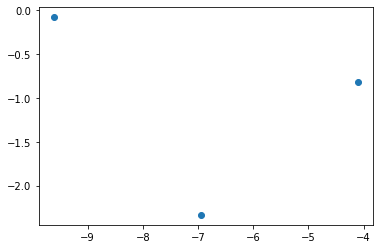

In [75]:
plt.scatter(true_reds.real, true_reds.imag)

In [27]:
# Make the initial guess be a small ball around the true values
nreds = edges.size - 1
true_reds = np.zeros(nreds, dtype=complex)
for i, (start, stop) in enumerate(zip(edges, edges[1:])):
    true_reds[i] = sorted_reds[start:stop].mean()
n_ants = len(set(ant_1_inds).union(ant_2_inds))
true_gains = np.ones(n_ants, dtype=complex)
ndim = 2 * (true_reds.size+n_ants)
init_complex_params = np.concatenate([true_reds, true_gains])
init_params = np.zeros(ndim, dtype=float)
init_params[::2] = init_complex_params.real
init_params[1::2] = init_complex_params.imag

In [28]:
nwalkers = 300
init_guess = np.random.normal(
    loc=init_params,
    scale=0.005,
    size=(nwalkers, ndim),
)

In [76]:
#args = ngrps, nants, noise, data, ant_1_inds, ant_2_inds, edges
args = [
    nreds,
    n_ants,
    noise,
    sorted_data,
    sorted_ant_1_inds,
    sorted_ant_2_inds,
    edges,
]
kwargs = dict(
    abs_amp=1,
    amp_scale=0.5,
    abs_phs=0,
    phs_scale=np.pi/6,
    antpos=np.vstack(list(array_layout.values())),
    phs_gradient=np.zeros(3),
)
burn_iter = 500
full_iter = 10000

In [77]:
corrcal_sampler = emcee.EnsembleSampler(nwalkers, ndim, corrcal_chisq, args=args, kwargs=kwargs)
burn_in = corrcal_sampler.run_mcmc(init_guess, burn_iter)
corrcal_sampler.reset()
corrcal_sampler.run_mcmc(burn_in, full_iter);

In [78]:
chain = corrcal_sampler.get_chain(flat=True)

In [79]:
f'{chain.shape[0]:.2e}'

'1.50e+06'

In [80]:
n_pts = 1000000
plot_chain = chain#[-n_pts:,:]

In [81]:
labels = []
for i in range(nreds):
    labels.append(r"Re$V_{i}$".format(i=i))
    labels.append(r"Im$V_{i}$".format(i=i))
for ant in range(n_ants):
    labels.append(r"Re$g_{ant}$".format(ant=ant))
    labels.append(r"Im$g_{ant}$".format(ant=ant))

In [82]:
alt_labels = []
for i in range(3):
    alt_labels.append(r"$|V_{i}|$".format(i=i))
    alt_labels.append(r"arg$(V_{i})$".format(i=i))
for i in range(7):
    alt_labels.append(r"$|g_{i}|$".format(i=i))
    alt_labels.append(r"arg$(g_{i})$".format(i=i))

In [83]:
import triangle

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


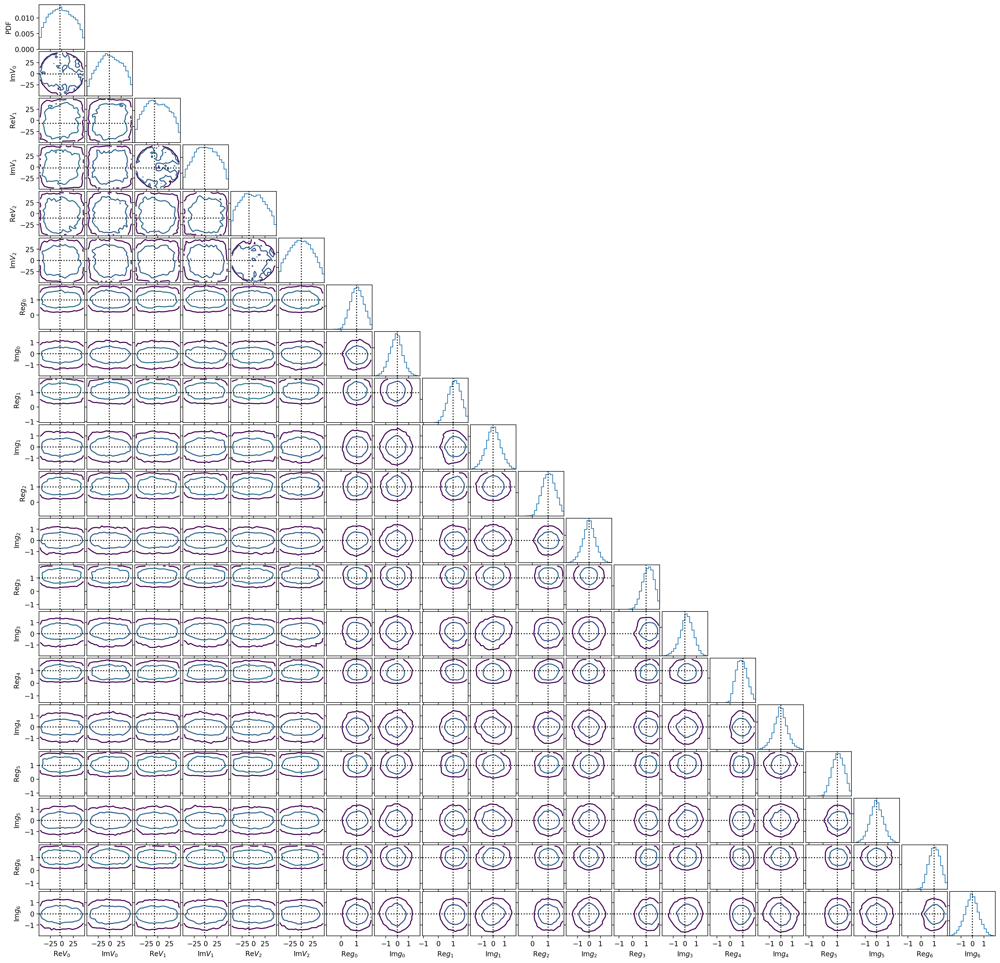

In [84]:
fig, axes = triangle.plot_triangle(
    chain, labels=labels, fig_kwargs=dict(figsize=(25,25), dpi=200, facecolor='white'), true_vals=init_params
)
fig.savefig("corrcal_chisq_contours_with_priors.png", dpi=200, bbox_inches="tight")

In [85]:
alt_chain = np.zeros_like(chain)
alt_truths = np.zeros_like(init_params)
for i in range(3):
    re_vis = chain[:,2*i]
    im_vis = chain[:,2*i+1]
    alt_chain[:,2*i] = np.sqrt(re_vis**2 + im_vis**2)
    alt_chain[:,2*i+1] = (np.arctan2(im_vis, re_vis) + 2*np.pi) % (2*np.pi)
    alt_truths[2*i] = np.sqrt(init_params[2*i]**2 + init_params[2*i+1]**2)
    alt_truths[2*i+1] = (np.arctan2(init_params[2*i+1], init_params[2*i]) + 2*np.pi) % (2*np.pi)
for i in range(7):
    re_g = chain[:,6+2*i]
    im_g = chain[:,6+2*i+1]
    alt_chain[:,6+2*i] = np.sqrt(re_g**2 + im_g**2)
    alt_chain[:,6+2*i+1] = np.arctan2(im_g, re_g)
alt_truths[6::2] = 1

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


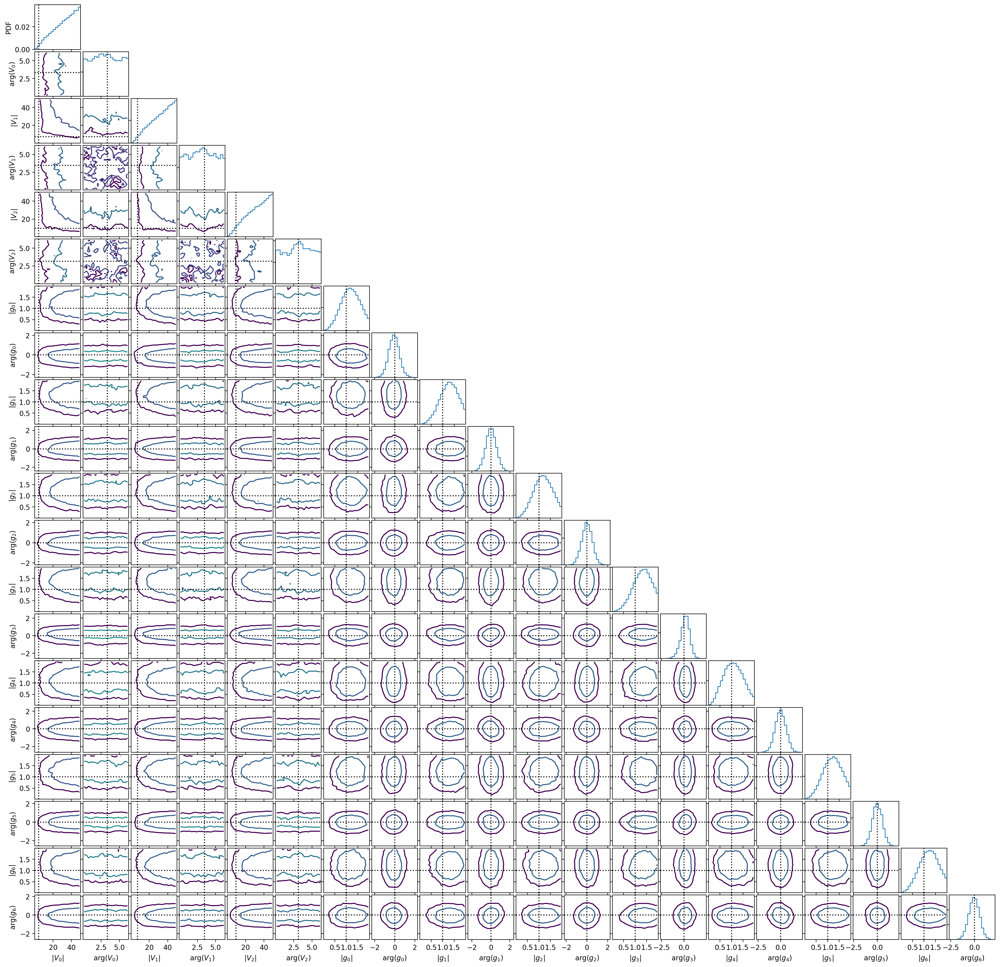

In [86]:
fig, axes = triangle.plot_triangle(
    alt_chain, labels=alt_labels, fig_kwargs=dict(figsize=(25,25), dpi=200, facecolor='white'), true_vals=alt_truths
)
fig.savefig("alt_corrcal_chisq_contours_with_priors.png", dpi=200, bbox_inches="tight")

In [41]:
# fig = corner.corner(plot_chain, labels=labels, truths=init_params)
# fig.set_facecolor("white")
# fig.savefig("corrcal_chisq_with_priors.png", dpi=150, bbox_inches="tight")
# plt.close(fig)

In [42]:
del chain, corrcal_sampler

In [45]:
redcal_sampler = emcee.EnsembleSampler(nwalkers, ndim, redcal_chisq, args=args, kwargs=kwargs)
# burn_in = redcal_sampler.run_mcmc(init_guess, burn_iter)
# redcal_sampler.reset()
redcal_sampler.run_mcmc(burn_in, full_iter);

In [46]:
chain = redcal_sampler.get_chain(flat=True)

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


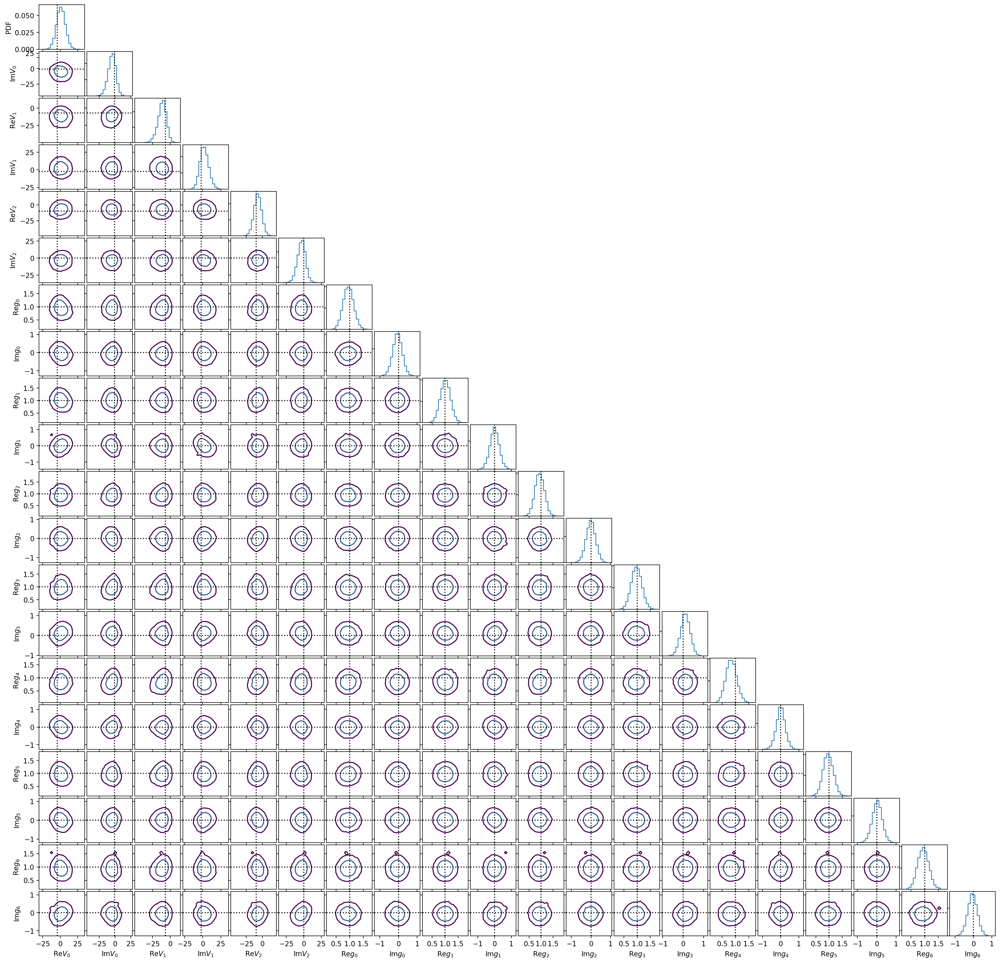

In [47]:
fig, axes = triangle.plot_triangle(
    chain, labels=labels, fig_kwargs=dict(figsize=(25,25), dpi=200, facecolor='white'), true_vals=init_params
)
fig.savefig("redcal_chisq_contours_with_priors.png", dpi=200, bbox_inches="tight")

In [48]:
# fig = corner.corner(chain, labels=labels, truths=init_params)
# fig.set_facecolor("white")
# fig.savefig("redcal_chisq_with_priors.png", dpi=150, bbox_inches="tight")
# plt.close(fig)

In [49]:
alt_chain = np.zeros_like(chain)
for i in range(3):
    re_vis = chain[:,2*i]
    im_vis = chain[:,2*i+1]
    alt_chain[:,2*i] = np.sqrt(re_vis**2 + im_vis**2)
    alt_chain[:,2*i+1] = (np.arctan2(im_vis, re_vis) + 2*np.pi) % (2*np.pi)
for i in range(7):
    re_g = chain[:,6+2*i]
    im_g = chain[:,6+2*i+1]
    alt_chain[:,6+2*i] = np.sqrt(re_g**2 + im_g**2)
    alt_chain[:,6+2*i+1] = np.arctan2(im_g, re_g)

This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 


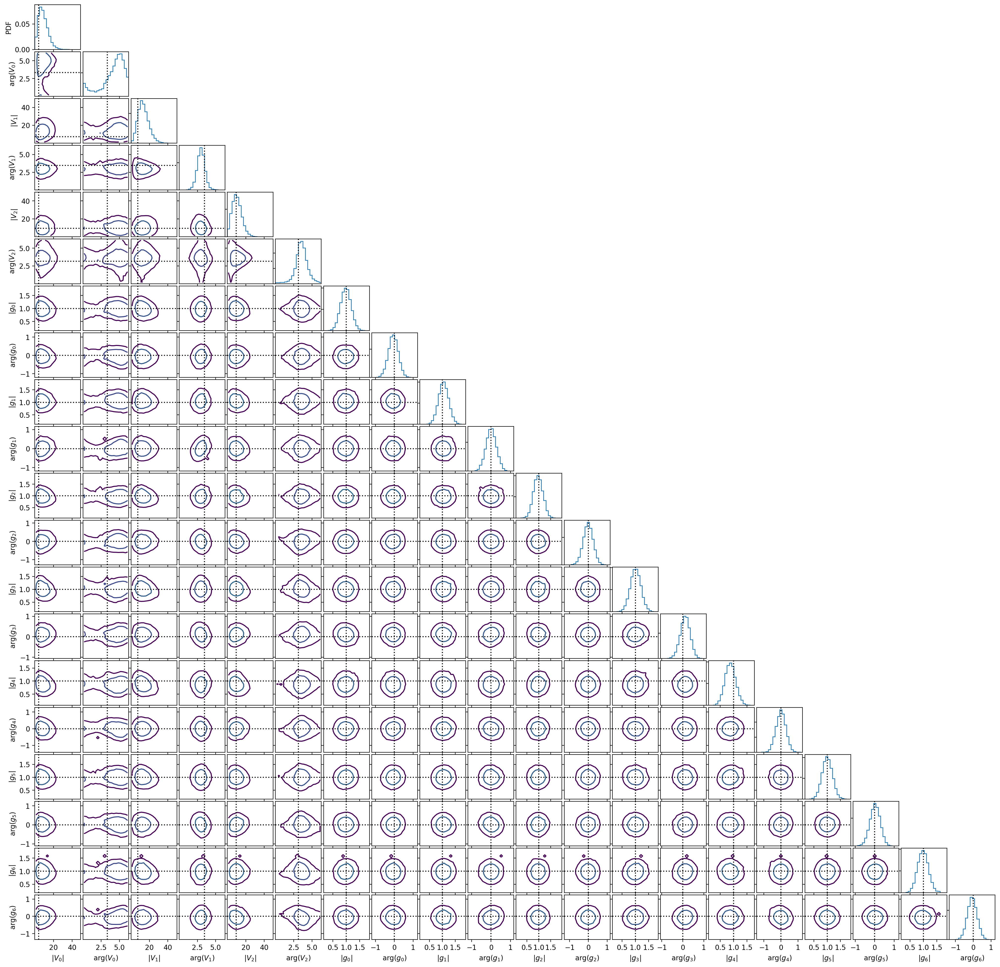

In [50]:
fig, axes = triangle.plot_triangle(
    alt_chain, labels=alt_labels, fig_kwargs=dict(figsize=(25,25), dpi=200, facecolor='white'), true_vals=alt_truths
)
fig.savefig("alt_redcal_chisq_contours_with_priors.png", dpi=200, bbox_inches="tight")

In [51]:
del chain, redcal_sampler